# AT1 - Australian Skills Classification (ASC) Text Analysis

## Project Overview

The Australian Government employs the use of the Australian Skills Classification (ASC) to consolidate the core competencies, specialist tasks and technology tools required for the country's occupations. Through the ASC, a common language of skills are made accessible, enabling any stakeholder to be able to identify and articulate the skills using a universal and comprehensive taxonomy.

This project aims to assess whether the current ASC satisfies its objectives using Natural Language Processing (NLP) Techniques.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

file_path = "/content/drive/My Drive/NLP/AT1/Australian Skills Classification - December 2023.xlsx"


In [ ]:
import nltk

nltk.download('punkt_tab')

from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

nltk.download("stopwords")

import re
import nltk
from collections import Counter
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

from nltk import ngrams
from collections import Counter
import re

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
for var in [var for var in globals() if isinstance(globals()[var], pd.DataFrame)]:
    del globals()[var]

In [ ]:
import pandas as pd

# Load Excel file
file_path = "/content/drive/My Drive/NLP/AT1/Australian Skills Classification - December 2023.xlsx"  # Replace with your file path
xls = pd.ExcelFile(file_path)

# Loop through each sheet and create a DataFrame with the sheet name as the variable name
for sheet_name in xls.sheet_names:
    # Replace spaces and special characters in sheet names for valid variable names
    df_name = sheet_name.strip().replace(" ", "_").replace("-", "_")
    globals()[df_name] = xls.parse(sheet_name)

In [ ]:
# Get all variables in the global namespace
existing_dfs = [var for var in globals() if isinstance(globals()[var], pd.DataFrame)]

# Print the list of DataFrame names
print("Existing DataFrames:", existing_dfs)

Existing DataFrames: ['Index', 'Glossary', 'Occupation_descriptions', 'Core_competency_descriptions', 'Specialist_tasks_hierarchy', 'Tech_tools_heirarchy', 'Core_competencies', 'Specialist_tasks_data', 'Technology_tools', 'Appendix___tech_tool_examples', 'Appendix___common_tech_tools']


In [ ]:
df_analysis = ['Occupation_descriptions', 'Core_competency_descriptions', 'Specialist_tasks_hierarchy', 'Tech_tools_heirarchy', 'Core_competencies', 'Specialist_tasks_data', 'Technology_tools']

In [ ]:
for df_name in df_analysis:
    print(f"\n--- DataFrame: {df_name} ---")
    print(globals()[df_name].info())  # Print .info() for each DataFrame


--- DataFrame: Occupation_descriptions ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1650 entries, 0 to 1649
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Occupation Type     1650 non-null   object
 1   ANZSCO Code         1650 non-null   int64 
 2   Sub-Profile Code    472 non-null    object
 3   ANZSCO Title        1650 non-null   object
 4   ANZSCO Description  1650 non-null   object
dtypes: int64(1), object(4)
memory usage: 64.6+ KB
None

--- DataFrame: Core_competency_descriptions ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 5 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Core Competency              100 non-null    object
 1   Core Competency Description  100 non-null    object
 2   Score                        100 non-null    int64 
 3   Proficiency Leve

In [ ]:
for df_name in df_analysis:
    df = globals()[df_name]
    print(f"\n--- DataFrame: {df_name} ---")
    print(df.isna().sum())
    print(f"total number of rows: {df.count().max()}")


--- DataFrame: Occupation_descriptions ---
Occupation Type          0
ANZSCO Code              0
Sub-Profile Code      1178
ANZSCO Title             0
ANZSCO Description       0
dtype: int64
total number of rows: 1650

--- DataFrame: Core_competency_descriptions ---
Core Competency                0
Core Competency Description    0
Score                          0
Proficiency Level              0
Anchor Value                   0
dtype: int64
total number of rows: 100

--- DataFrame: Specialist_tasks_hierarchy ---
Specialist Task       0
Specialist Cluster    0
Cluster Family        0
Skill Statement       0
dtype: int64
total number of rows: 1686

--- DataFrame: Tech_tools_heirarchy ---
Technology Tool Category                0
Technology Tool Category Description    0
Technology Tool                         0
Technology Tool Description             0
Technology Tool Extended Description    0
dtype: int64
total number of rows: 94

--- DataFrame: Core_competencies ---
Occupation Type   

In [ ]:
def word_count(text):
    if isinstance(text, str):  # Ensure it's a string
        return len(text.split())
    return 0

print total wordcount of each df

In [ ]:
# List to store results
wordcount_results = []

# Loop through each DataFrame and calculate total word count
for df_name in df_analysis:
    df = globals()[df_name]  # Get the DataFrame from globals
    total_word_count = df.select_dtypes(include=['object']).map(word_count).sum().sum()  # Sum across all text columns
    wordcount_results.append({"DataFrame": df_name, "Total_Word_Count": total_word_count})

# Create a new DataFrame to store results
df_wordcount = pd.DataFrame(wordcount_results)

# Print the result
print(df_wordcount)

                      DataFrame  Total_Word_Count
0       Occupation_descriptions             54632
1  Core_competency_descriptions              2767
2    Specialist_tasks_hierarchy            127896
3          Tech_tools_heirarchy              7704
4             Core_competencies            214414
5         Specialist_tasks_data           2550020
6              Technology_tools             56109


Count NA for each df

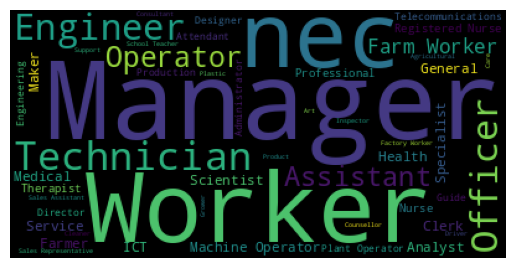

In [ ]:
from wordcloud import WordCloud

import matplotlib.pyplot as plt

OD_ANZSCOtitle = Occupation_descriptions['ANZSCO Title'].to_string()

wordcloud = WordCloud(max_words=50).generate(OD_ANZSCOtitle)

plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [ ]:
tokens = word_tokenize(OD_ANZSCOtitle)

stop_words = set(stopwords.words("english"))
tokens_clean = [word.lower() for word in tokens if word.isalnum() and word.lower() not in stop_words]

def find_frequent_words(tokens, min_count=10):
    word_counts = Counter(tokens)
    sorted_word_counts = sorted(word_counts.items(), key=lambda x: x[1], reverse=True)  # Returns a list of tuples
    return sorted_word_counts[:20]

print("Without Stopwords:", find_frequent_words(tokens))
print("Cleaned:", find_frequent_words(tokens_clean))


Without Stopwords: [('and', 217), ('(', 96), (')', 96), ('Worker', 88), ('Manager', 76), ('nec', 75), ('Operator', 73), ('or', 55), ('Workers', 49), (',', 48), ('Engineer', 46), ('Technician', 46), ('Officer', 44), ('Machine', 37), ('Assistant', 37), ('Nurse', 34), ('Farm', 31), ('Managers', 30), ('Sales', 30), ('Professionals', 29)]
Cleaned: [('worker', 88), ('manager', 76), ('nec', 75), ('operator', 73), ('workers', 49), ('engineer', 46), ('technician', 46), ('officer', 44), ('machine', 37), ('assistant', 37), ('nurse', 34), ('farm', 31), ('managers', 30), ('sales', 30), ('professionals', 29), ('engineering', 26), ('health', 26), ('general', 25), ('ict', 22), ('plant', 22)]


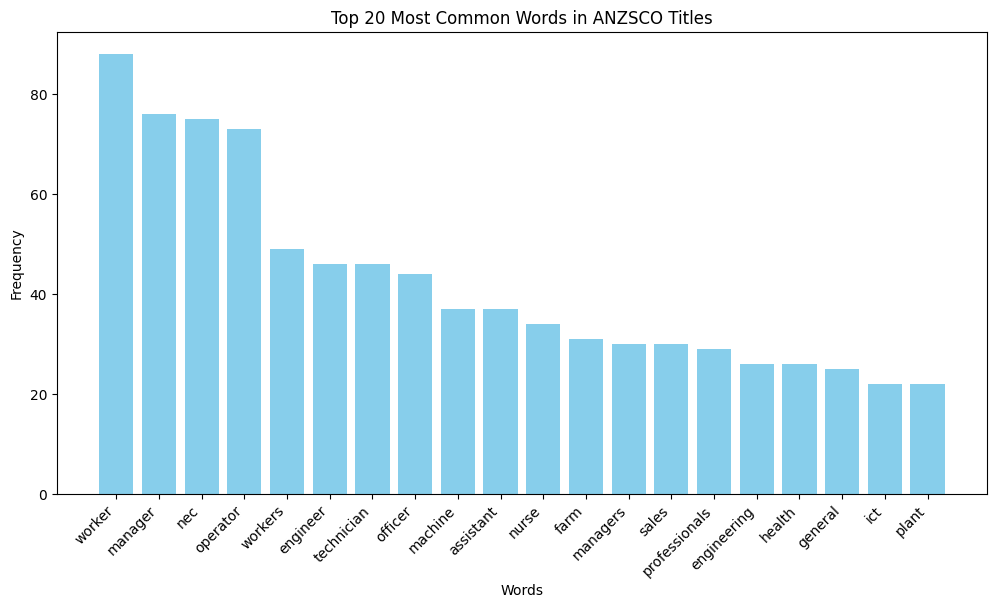

In [ ]:
top_titles = find_frequent_words(tokens_clean)
# Extract words and counts for plotting
words, counts = zip(*top_titles)

# Plot bar chart
plt.figure(figsize=(12, 6))
plt.bar(words, counts, color='skyblue')
plt.xticks(rotation=45, ha="right")
plt.xlabel("Words")
plt.ylabel("Frequency")
plt.title("Top 20 Most Common Words in ANZSCO Titles")
plt.show()

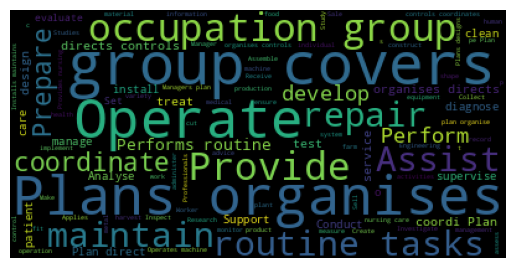

In [ ]:
OD_ANZSCODescription = Occupation_descriptions['ANZSCO Description'].to_string()

wordcloud_OD_ANZSCODescription = WordCloud(max_words=100).generate(OD_ANZSCODescription)

plt.imshow(wordcloud_OD_ANZSCODescription)
plt.axis("off")
plt.show()

In [ ]:
# Load English stopwords
stop_words = set(stopwords.words("english"))

# Convert the column to a string
OD_ANZSCODescription = Occupation_descriptions['ANZSCO Description'].to_string()

# Tokenize text
tokens_desc = word_tokenize(OD_ANZSCODescription)

# Remove stopwords and punctuation
tokens_desc_clean = [word.lower() for word in tokens_desc if word.isalnum() and word.lower() not in stop_words]

def find_frequent_words(tokens, min_count=10):
    word_counts = Counter(tokens)
    sorted_word_counts = sorted(word_counts.items(), key=lambda x: x[1], reverse=True)  # Returns a list of tuples
    return sorted_word_counts[:20]

print("Without Stopwords:", find_frequent_words(tokens_desc))
print("Cleaned:", find_frequent_words(tokens_desc_clean))

Without Stopwords: [('...', 1613), (',', 1280), ('and', 1177), ('to', 232), ('of', 195), ('the', 181), ('a', 177), ('or', 172), ('in', 151), ('Plans', 129), ('for', 87), ('controls', 87), ('organises', 86), ('This', 85), ('group', 84), ('covers', 84), ('tasks', 78), ('occupation', 76), ('Performs', 73), ('Operates', 71)]
Cleaned: [('plans', 143), ('organises', 101), ('controls', 93), ('performs', 85), ('group', 84), ('covers', 84), ('tasks', 78), ('operates', 77), ('provides', 77), ('occupation', 76), ('plan', 70), ('routine', 68), ('directs', 68), ('care', 54), ('direct', 52), ('maintains', 48), ('perform', 47), ('repairs', 47), ('designs', 46), ('coordinates', 45)]


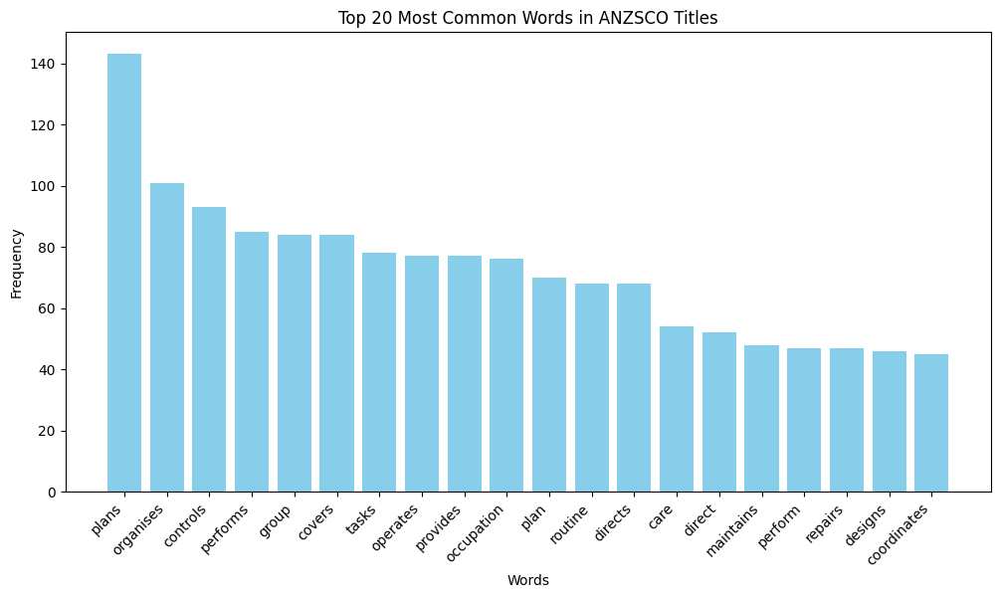

In [ ]:
top_titles = find_frequent_words(tokens_desc_clean)
# Extract words and counts for plotting
words, counts = zip(*top_titles)

# Plot bar chart
plt.figure(figsize=(12, 6))
plt.bar(words, counts, color='skyblue')
plt.xticks(rotation=45, ha="right")
plt.xlabel("Words")
plt.ylabel("Frequency")
plt.title("Top 20 Most Common Words in ANZSCO Titles")
plt.show()

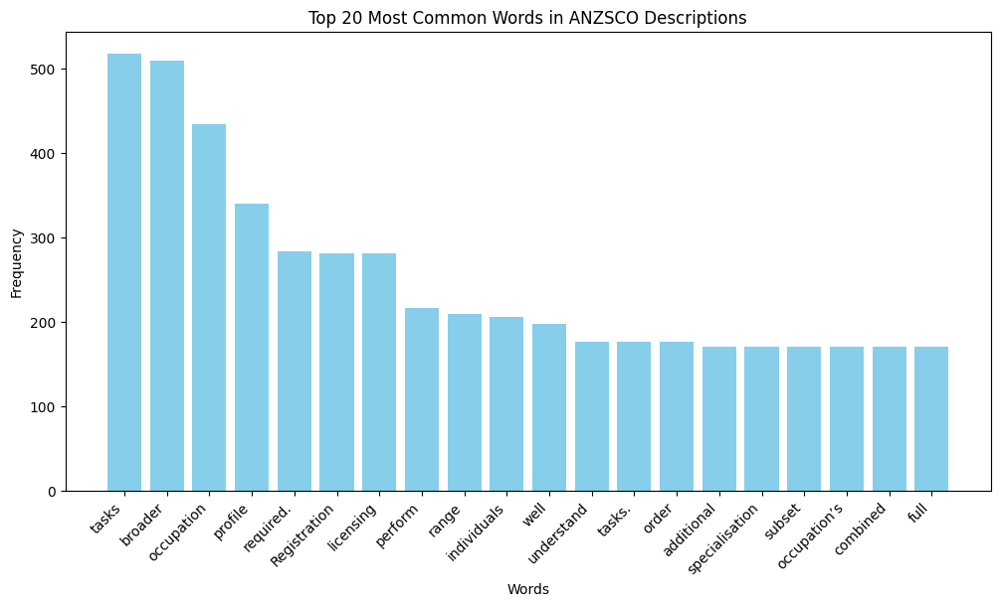

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import STOPWORDS

# Convert the column to a single string
OD_ANZSCODescription = " ".join(Occupation_descriptions['ANZSCO Description'].astype(str))

# Tokenize words and count frequency
word_counts = Counter(OD_ANZSCODescription.split())

# Remove common stopwords
stopwords = set(STOPWORDS)  # Default stopwords from WordCloud
filtered_word_counts = {word: count for word, count in word_counts.items() if word.lower() not in stopwords}

# Get top 20 most common words
common_words = sorted(filtered_word_counts.items(), key=lambda x: x[1], reverse=True)[:20]

# Extract words and counts for plotting
words, counts = zip(*common_words)

# Plot bar chart
plt.figure(figsize=(12, 6))
plt.bar(words, counts, color='skyblue')
plt.xticks(rotation=45, ha="right")
plt.xlabel("Words")
plt.ylabel("Frequency")
plt.title("Top 20 Most Common Words in ANZSCO Descriptions")
plt.show()

In [ ]:
occupation_counts = Occupation_descriptions["Occupation Type"].value_counts()
ANZSCO_counts = Occupation_descriptions["ANZSCO Code"].value_counts()
subprofile_counts = Occupation_descriptions["Sub-Profile Code"].value_counts()

# Print the counts
print(occupation_counts)
print(ANZSCO_counts)
print(subprofile_counts)

Occupation Type
ANZSCO 6                   806
NEC Category Occupation    302
ANZSCO 4                   297
Specialisation             170
NEC Category                75
Name: count, dtype: int64
ANZSCO Code
399999    14
253399    13
712311    11
272499    10
311299     9
          ..
212311     1
212312     1
212313     1
212314     1
253316     1
Name: count, Length: 1178, dtype: int64
Sub-Profile Code
S01    82
N01    73
N02    63
N03    52
N04    42
S02    37
N05    28
S03    26
N06    17
S04    10
N07    10
N08     7
S05     6
S07     3
N09     3
N11     2
N12     2
S06     2
N10     2
S08     2
N13     1
S09     1
S10     1
Name: count, dtype: int64


In [ ]:
def get_top_ngrams(text, n, top_k):

    # Generate n-grams
    n_grams = list(ngrams(text, n))

    # Count the frequency of each n-gram
    n_gram_freq = Counter(n_grams)

    # Get the top k most frequent n-grams
    top_n_grams = n_gram_freq.most_common(top_k)

    return top_n_grams


# Get top 10 bigrams
top_bigrams = get_top_ngrams(tokens_clean, 2, 10)

# Get top 10 bigrams
top_bigrams_desc = get_top_ngrams(tokens_desc_clean, 2, 10)

# Get top 10 trigrams
top_trigrams_desc = get_top_ngrams(tokens_desc_clean, 3, 10)


# Print results
print("Top 10 Bigrams: Title")
for bigram, count in top_bigrams:
    print(f"{bigram}: {count}")
print()
# Print results
print("Top 10 Bigrams: Description")
for bigram, count in top_bigrams_desc:
    print(f"{bigram}: {count}")

print("\nTop 10 Trigrams: Description")
for trigram, count in top_trigrams_desc:
    print(f"{trigram}: {count}")

Top 10 Bigrams: Title
('farm', 'worker'): 25
('machine', 'operator'): 24
('registered', 'nurse'): 18
('workers', 'nec'): 13
('plant', 'operator'): 12
('professionals', 'nec'): 10
('trades', 'workers'): 9
('sales', 'representative'): 9
('factory', 'worker'): 9
('machine', 'operators'): 8

Top 10 Bigrams: Description
('group', 'covers'): 84
('plans', 'organises'): 82
('occupation', 'group'): 75
('routine', 'tasks'): 59
('performs', 'routine'): 48
('organises', 'directs'): 47
('directs', 'controls'): 47
('controls', 'coordi'): 42
('organises', 'controls'): 36
('plan', 'direct'): 32

Top 10 Trigrams: Description
('occupation', 'group', 'covers'): 75
('plans', 'organises', 'directs'): 47
('organises', 'directs', 'controls'): 47
('performs', 'routine', 'tasks'): 46
('directs', 'controls', 'coordi'): 42
('plan', 'direct', 'coordinate'): 30
('plans', 'organises', 'controls'): 23
('organises', 'controls', 'coordinates'): 23
('controls', 'coordinates', 'pe'): 20
('provides', 'nursing', 'care'): 

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...


[[1.         0.16511394 0.         ... 0.         0.         0.        ]
 [0.16511394 1.         0.12990479 ... 0.         0.         0.        ]
 [0.         0.12990479 1.         ... 0.03096588 0.         0.        ]
 ...
 [0.         0.         0.03096588 ... 1.         0.10487384 0.02006799]
 [0.         0.         0.         ... 0.10487384 1.         0.        ]
 [0.         0.         0.         ... 0.02006799 0.         1.        ]]


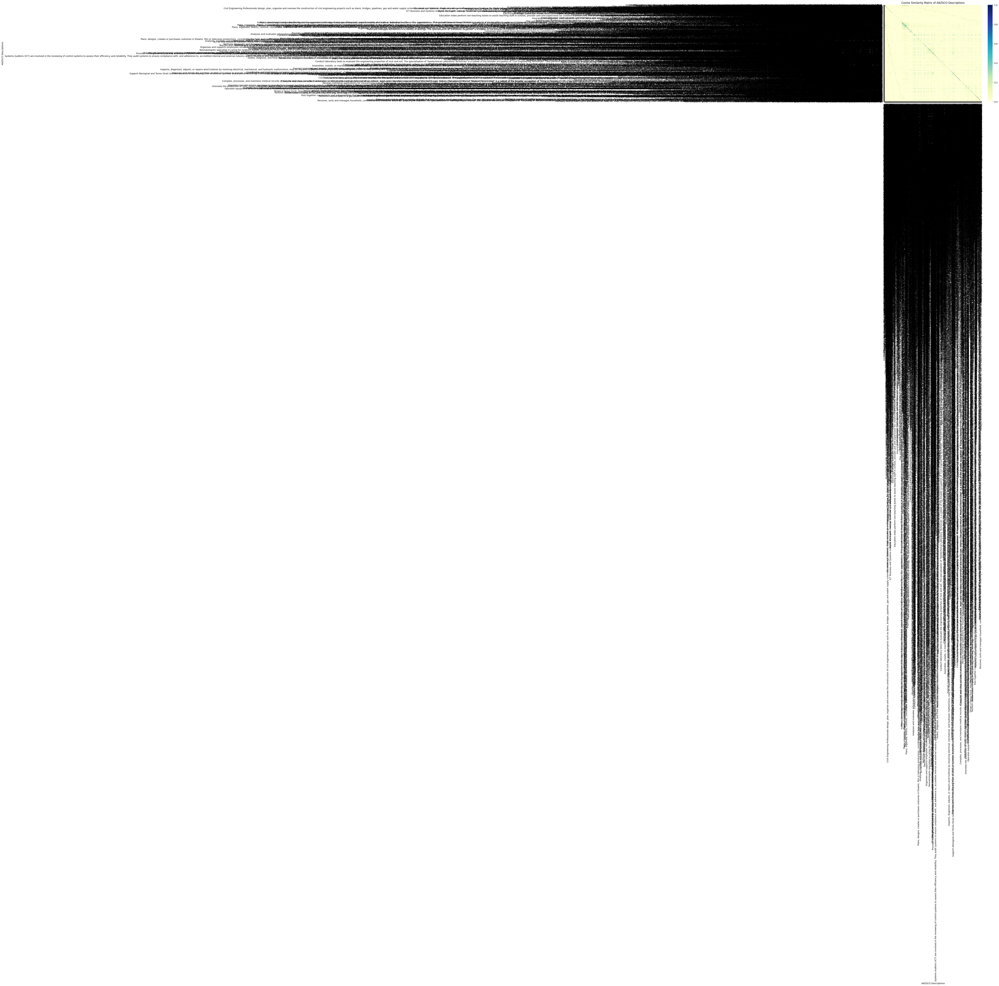

In [ ]:
import pandas as pd
import nltk
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Ensure necessary NLTK datasets are downloaded
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Load the dataset
# Assuming Occupation_descriptions is your DataFrame containing the data

# Function to clean text
def clean_text(text):
    stop_words = set(stopwords.words("english"))
    lemmatizer = WordNetLemmatizer()

    # Tokenization
    tokens = word_tokenize(text.lower())

    # Remove stopwords and non-alphanumeric characters
    tokens_clean = [lemmatizer.lemmatize(word) for word in tokens if word.isalnum() and word not in stop_words]
    return " ".join(tokens_clean)

# Apply cleaning function to 'ANZSCO Description' column
cleaned_descriptions = Occupation_descriptions['ANZSCO Description'].apply(clean_text)

# Vectorize the cleaned descriptions using TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(cleaned_descriptions)

# Compute cosine similarity between rows
cos_sim_matrix = cosine_similarity(tfidf_matrix)

# Display the cosine similarity matrix
print(cos_sim_matrix)

# Optional: Visualize the cosine similarity matrix with a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cos_sim_matrix, annot=False, cmap="YlGnBu", xticklabels=Occupation_descriptions['ANZSCO Description'], yticklabels=Occupation_descriptions['ANZSCO Description'])
plt.title("Cosine Similarity Matrix of ANZSCO Descriptions")
plt.xlabel("ANZSCO Descriptions")
plt.ylabel("ANZSCO Descriptions")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

In [ ]:
import numpy as np
import pandas as pd

# Define a threshold for similarity
threshold = 0.8

# Assuming you have a DataFrame called 'df' and a cosine similarity matrix 'cos_sim_matrix'
# Get the indices of the highly similar pairs
similar_pairs = np.where(cos_sim_matrix > threshold)

# Create a dictionary to store the count of high similarity for each 'ANZSCO Title'
similarity_count = {}

# Loop through the pairs and count the similarities
for i, j in zip(*similar_pairs):
    if i != j:  # Avoid comparing the row with itself
        title_i = Occupation_descriptions['ANZSCO Title'].iloc[i]
        title_j = Occupation_descriptions['ANZSCO Title'].iloc[j]

        # Update the count for each ANZSCO Title pair
        similarity_count[title_i] = similarity_count.get(title_i, 0) + 1
        similarity_count[title_j] = similarity_count.get(title_j, 0) + 1

# Sort the titles based on the number of similarities
sorted_titles = sorted(similarity_count.items(), key=lambda x: x[1], reverse=True)

# Print the top 10 rows with high similarity
print("Top 10 ANZSCO Titles with high similarity:")
for title, count in sorted_titles[:20]:
    print(f"Title: {title} - Similarity Count: {count}")

Top 10 ANZSCO Titles with high similarity:
Title: Coffee Grower - Similarity Count: 18
Title: Ginger Farmer - Similarity Count: 18
Title: Hop Farmer - Similarity Count: 18
Title: Mushroom Grower - Similarity Count: 18
Title: Alpaca Farmer - Similarity Count: 16
Title: Crocodile Farmer - Similarity Count: 16
Title: Emu Farmer - Similarity Count: 16
Title: Llama Farmer - Similarity Count: 16
Title: Ostrich Farmer - Similarity Count: 16
Title: Tree Farmer - Similarity Count: 8
Title: Photogrammetric Surveyor - Similarity Count: 8
Title: Engineering Surveyor - Similarity Count: 6
Title: Hydrographic Surveyor - Similarity Count: 6
Title: Mine Surveyor - Similarity Count: 6
Title: Music Teacher (Private Tuition) - Similarity Count: 6
Title: Clothing Sales Assistant - Similarity Count: 6
Title: Cosmetic Sales Assistant - Similarity Count: 6
Title: Fast Food Sales Assistant - Similarity Count: 6
Title: Hardware Sales Assistant - Similarity Count: 6
Title: Goat Herder - Similarity Count: 6


In [ ]:
import numpy as np
import pandas as pd

# Define a threshold for similarity
threshold = 0.8

# Normalize function to handle variations like plural forms
def normalize_title(title):
    # Convert title to lowercase and remove "s" from the end (if it exists)
    normalized = title.lower().rstrip('s')
    return normalized

# Assuming you have a DataFrame called 'Occupation_descriptions' and a cosine similarity matrix 'cos_sim_matrix'
# Get the indices of the highly similar pairs
similar_pairs = np.where(cos_sim_matrix > threshold)

# Create a dictionary to store the count of high similarity and similar titles for each 'ANZSCO Title'
similarity_count = {}
similar_titles = {}

# Loop through the pairs and count the similarities
for i, j in zip(*similar_pairs):
    if i != j:  # Avoid comparing the row with itself
        title_i = Occupation_descriptions['ANZSCO Title'].iloc[i]
        title_j = Occupation_descriptions['ANZSCO Title'].iloc[j]

        # Normalize titles before processing them
        normalized_title_i = normalize_title(title_i)
        normalized_title_j = normalize_title(title_j)

        # Update the count for each normalized ANZSCO Title pair
        similarity_count[normalized_title_i] = similarity_count.get(normalized_title_i, 0) + 1
        similarity_count[normalized_title_j] = similarity_count.get(normalized_title_j, 0) + 1

        # Track the similar titles for each normalized 'ANZSCO Title'
        if normalized_title_i not in similar_titles:
            similar_titles[normalized_title_i] = []
        if normalized_title_j not in similar_titles:
            similar_titles[normalized_title_j] = []

        similar_titles[normalized_title_i].append(normalized_title_j)
        similar_titles[normalized_title_j].append(normalized_title_i)

# Sort the titles based on the number of similarities (highest first)
sorted_titles = sorted(similarity_count.items(), key=lambda x: x[1], reverse=True)

# Set to keep track of processed titles to avoid repeating them
processed_titles = set()

# Print the top titles with high similarity, ensuring no repeats
print("Top ANZSCO Titles with high similarity:")

for normalized_title, count in sorted_titles:
    if normalized_title in processed_titles:
        continue  # Skip if this title has already been processed

    # Find the original title (remove normalization for display)
    original_titles = Occupation_descriptions['ANZSCO Title'][Occupation_descriptions['ANZSCO Title'].apply(normalize_title) == normalized_title]
    original_title = original_titles.iloc[0]  # Take the first match (assuming there's only one)

    # Get the row indices that correspond to this title
    row_indices = Occupation_descriptions[Occupation_descriptions['ANZSCO Title'].apply(normalize_title) == normalized_title].index.tolist()

    # Print the title and its similarity count
    print(f"\nTitle: {original_title} - Similarity Count: {count}")

    # Print the row numbers (indices)
    print("Corresponding Row Numbers:")
    for index in row_indices:
        print(index)  # Print the row index number

    # Get all similar titles (no duplicates)
    similar_titles_set = ()
    similar_titles_set = set(similar_titles[normalized_title])

    # Print all similar titles for the current title
    similar_titles_display = Occupation_descriptions['ANZSCO Title'][Occupation_descriptions['ANZSCO Title'].apply(normalize_title).isin(similar_titles_set)]
    print(f"Similar Titles: {', '.join(similar_titles_display)}")

    # Add this title and its similar titles to the processed set to avoid repeating them
    processed_titles.add(normalized_title)

    # Add all similar titles to processed set, so they won't be printed in any future iterations
    processed_titles.update(similar_titles_set)


Top ANZSCO Titles with high similarity:

Title: Coffee Grower - Similarity Count: 18
Corresponding Row Numbers:
331
Similar Titles: Alpaca Farmer, Crocodile Farmer, Emu Farmer, Llama Farmer, Ostrich Farmer, Tree Farmer, Ginger Farmer, Hop Farmer, Mushroom Grower

Title: Photogrammetric Surveyor - Similarity Count: 8
Corresponding Row Numbers:
574
Similar Titles: Engineering Surveyor, Geodetic Surveyor, Hydrographic Surveyor, Mine Surveyor

Title: Secondary School Teachers - Similarity Count: 6
Corresponding Row Numbers:
74
687
Similar Titles: Secondary School Teachers, Middle School Teacher / Intermediate School Teacher, Secondary School Teacher

Title: Music Teacher (Private Tuition) - Similarity Count: 6
Corresponding Row Numbers:
703
Similar Titles: Art Teacher (Private Tuition), Dance Teacher (Private Tuition), Drama Teacher (Private Tuition)

Title: Clothing Sales Assistant - Similarity Count: 6
Corresponding Row Numbers:
1345
Similar Titles: Cosmetic Sales Assistant, Fast Food Sa

In [ ]:
import numpy as np
import pandas as pd

# Define a threshold for similarity
threshold = 0.8

# Assuming you have a DataFrame called 'df' and a cosine similarity matrix 'cos_sim_matrix'
# Get the indices of the highly similar pairs
similar_pairs = np.where(cos_sim_matrix > threshold)

# Create a dictionary to store the count of high similarity and similar titles for each 'ANZSCO Title'
similarity_count = {}
similar_titles = {}

# Loop through the pairs and count the similarities
for i, j in zip(*similar_pairs):
    if i != j:  # Avoid comparing the row with itself
        title_i = Occupation_descriptions['ANZSCO Title'].iloc[i]
        title_j = Occupation_descriptions['ANZSCO Title'].iloc[j]

        # Update the count for each ANZSCO Title pair
        similarity_count[title_i] = similarity_count.get(title_i, 0) + 1
        similarity_count[title_j] = similarity_count.get(title_j, 0) + 1

        # Track the similar titles for each 'ANZSCO Title'
        if title_i not in similar_titles:
            similar_titles[title_i] = []
        if title_j not in similar_titles:
            similar_titles[title_j] = []

        similar_titles[title_i].append(title_j)
        similar_titles[title_j].append(title_i)

# Sort the titles based on the number of similarities (highest first)
sorted_titles = sorted(similarity_count.items(), key=lambda x: x[1], reverse=True)

# Set to keep track of processed titles to avoid repeating them
processed_titles = set()

# Print the top titles with high similarity, ensuring no repeats
print("Top ANZSCO Titles with high similarity:")

for title, count in sorted_titles:
    if title in processed_titles:
        continue  # Skip if this title has already been processed

    # Print the title and its similarity count
    print(f"\nTitle: {title} - Similarity Count: {count}")

    # Get the similar titles, removing duplicates using a set
    similar_titles_set = set(similar_titles[title])

    # Print all similar titles for the current title
    print(f"Similar Titles: {', '.join(similar_titles_set)}")

    # Add this title and its similar titles to the processed set to avoid repeating them
    processed_titles.add(title)
    processed_titles.update(similar_titles_set)

Top ANZSCO Titles with high similarity:

Title: Coffee Grower - Similarity Count: 18
Similar Titles: Mushroom Grower, Llama Farmer, Alpaca Farmer, Ginger Farmer, Crocodile Farmer, Tree Farmer, Ostrich Farmer, Hop Farmer, Emu Farmer

Title: Photogrammetric Surveyor - Similarity Count: 8
Similar Titles: Geodetic Surveyor, Mine Surveyor, Engineering Surveyor, Hydrographic Surveyor

Title: Music Teacher (Private Tuition) - Similarity Count: 6
Similar Titles: Art Teacher (Private Tuition), Dance Teacher (Private Tuition), Drama Teacher (Private Tuition)

Title: Clothing Sales Assistant - Similarity Count: 6
Similar Titles: Hardware Sales Assistant, Fast Food Sales Assistant, Cosmetic Sales Assistant

Title: Goat Herder - Similarity Count: 6
Similar Titles: Emu Farm Worker, Deer Farm Worker, Ostrich Farm Worker

Title: Middle School Teacher / Intermediate School Teacher - Similarity Count: 4
Similar Titles: Middle School Teachers / Intermediate School Teachers, Secondary School Teacher

Titl

In [ ]:
import pandas as pd

# Normalize function to handle singular and plural forms
def normalize_title(title):
    # Convert title to lowercase and remove "s" from the end (if it exists)
    normalized = title.lower().rstrip('s')
    return normalized

# Assuming you have a DataFrame called 'Occupation_descriptions'
titles = Occupation_descriptions['ANZSCO Title']

# Set to track the normalized titles
normalized_titles_set = set()
singular_plural_pairs = 0

# Loop through all titles to count singular-plural pairs
for title in titles:
    normalized_title = normalize_title(title)

    # If the normalized title is already in the set, it's a singular-plural pair
    if normalized_title in normalized_titles_set:
        singular_plural_pairs += 1
    else:
        # Add the normalized title to the set (whether singular or plural)
        normalized_titles_set.add(normalized_title)

# Calculate the total number of titles
total_titles = len(titles)

# Calculate the percentage of singular-plural pairs
percentage_singular_plural = (singular_plural_pairs / total_titles) * 100

# Print the results
print(f"Total Titles: {total_titles}")
print(f"Singular-Plural Pairs: {singular_plural_pairs}")
print(f"Percentage of Singular-Plural Pairs: {percentage_singular_plural:.2f}%")

Total Titles: 1650
Singular-Plural Pairs: 109
Percentage of Singular-Plural Pairs: 6.61%


In [ ]:
import pandas as pd

# Normalize function to handle singular and plural forms
def normalize_title(title):
    # Convert title to lowercase and remove "s" from the end (if it exists)
    normalized = title.lower().rstrip('s')
    return normalized

# Assuming you have a DataFrame called 'Occupation_descriptions'
# Ensure that the titles are strings
titles = Occupation_descriptions['ANZSCO Title'].astype(str)

# Set to track the normalized titles
normalized_titles_set = set()
singular_plural_pairs = []

# Loop through all titles to find singular-plural pairs
for title in titles:
    if pd.isna(title):  # Skip NaN values
        continue

    normalized_title = normalize_title(title)

    # If the normalized title is already in the set, it's a singular-plural pair
    if normalized_title in normalized_titles_set:
        # Find the original form (singular or plural)
        singular_title = normalized_title
        plural_title = title.lower() if title.lower() != singular_title else title.lower() + 's'
        singular_plural_pairs.append((singular_title, plural_title))
    else:
        # Add the normalized title to the set (whether singular or plural)
        normalized_titles_set.add(normalized_title)

# Print all singular-plural pairs
print("Singular-Plural Pairs:")
for singular, plural in singular_plural_pairs:
    print(f"Singular: {singular.title()} - Plural: {plural.title()}")

Singular-Plural Pairs:
Singular: Aquaculture Farmer - Plural: Aquaculture Farmers
Singular: Corporate Services Manager - Plural: Corporate Services Managers
Singular: Finance Manager - Plural: Finance Managers
Singular: Human Resource Manager - Plural: Human Resource Managers
Singular: Policy And Planning Manager - Plural: Policy And Planning Managers
Singular: Research And Development Manager - Plural: Research And Development Managers
Singular: Engineering Manager - Plural: Engineering Managers
Singular: Manufacturer - Plural: Manufacturers
Singular: Child Care Centre Manager - Plural: Child Care Centre Managers
Singular: School Principal - Plural: School Principals
Singular: Licensed Club Manager - Plural: Licensed Club Managers
Singular: Conference And Event Organiser - Plural: Conference And Event Organisers
Singular: Photographer - Plural: Photographers
Singular: Training And Development Professional - Plural: Training And Development Professionals
Singular: Economist - Plural: E

In [ ]:
import pandas as pd

# Normalize function to handle singular and plural forms
def normalize_title(title):
    # Convert title to lowercase and remove "s" from the end (if it exists)
    normalized = title.lower().rstrip('s')
    return normalized

# Assuming you have a DataFrame called 'Occupation_descriptions'
# Ensure that the titles are strings
titles = Occupation_descriptions['ANZSCO Title'].astype(str)

# Set to track the normalized titles
normalized_titles_set = set()
singular_plural_pairs = []

# Step 1: Find singular-plural pairs
for title in titles:
    if pd.isna(title):  # Skip NaN values
        continue

    normalized_title = normalize_title(title)

    # If the normalized title is already in the set, it's a singular-plural pair
    if normalized_title in normalized_titles_set:
        # Find the original form (singular or plural)
        singular_title = normalized_title
        plural_title = title.lower() if title.lower() != singular_title else title.lower() + 's'
        singular_plural_pairs.append((singular_title, plural_title))
    else:
        # Add the normalized title to the set (whether singular or plural)
        normalized_titles_set.add(normalized_title)

# Convert singular-plural pairs to a set for fast lookup
singular_plural_set = set()
for singular, plural in singular_plural_pairs:
    singular_plural_set.add(singular)
    singular_plural_set.add(plural)

# Step 2: Now perform the substring checks and exclude singular-plural titles
substring_counts = {}
exclude_words = ['senior', 'assistant']

for i, title in enumerate(titles):
    # Skip titles that are singular-plural pairs or contain "senior" or "assistant"
    if any(exclude_word in title.lower() for exclude_word in exclude_words) or normalize_title(title) in singular_plural_set:
        continue

    for j, other_title in enumerate(titles):
        if i != j:  # Avoid comparing the title with itself
            if title.lower() in other_title.lower():  # Check if 'title' is a substring of 'other_title'
                # Use the original form of the titles for printing
                original_title = Occupation_descriptions['ANZSCO Title'].iloc[i]
                original_other_title = Occupation_descriptions['ANZSCO Title'].iloc[j]

                # Increment the count for the substring match
                if title not in substring_counts:
                    substring_counts[title] = {'title': original_title, 'count': 0, 'matches': []}

                substring_counts[title]['count'] += 1
                substring_counts[title]['matches'].append(original_other_title)

# Print the results
print("Titles that are part of other titles:")
for normalized_title, info in substring_counts.items():
    print(f"Title: {info['title']} - Count: {info['count']}")
    print("Matches with other titles:")
    for match in info['matches']:
        print(f"  - {match}")
    print()

Titles that are part of other titles:
Title: Livestock Farmers - Count: 1
Matches with other titles:
  - Livestock Farmers nec

Title: Broadacre Crop Growers - Count: 1
Matches with other titles:
  - Broadacre Crop Growers nec

Title: Horticultural Crop Growers - Count: 1
Matches with other titles:
  - Horticultural Crop Growers nec

Title: Health and Welfare Services Managers - Count: 1
Matches with other titles:
  - Health and Welfare Services Managers nec

Title: ICT Managers - Count: 1
Matches with other titles:
  - ICT Managers nec

Title: Music Professionals - Count: 1
Matches with other titles:
  - Music Professionals nec

Title: Visual Arts and Crafts Professionals - Count: 1
Matches with other titles:
  - Visual Arts and Crafts Professionals nec

Title: Film, Television, Radio and Stage Directors - Count: 1
Matches with other titles:
  - Film, Television, Radio and Stage Directors nec

Title: Journalists and Other Writers - Count: 1
Matches with other titles:
  - Journalists a

In [ ]:


def get_top_ngrams(text, n, top_k):

    # Generate n-grams
    n_grams = list(ngrams(text, n))

    # Count the frequency of each n-gram
    n_gram_freq = Counter(n_grams)

    # Get the top k most frequent n-grams
    top_n_grams = n_gram_freq.most_common(top_k)

    return top_n_grams


tokenized_words=word_tokenize(OD_ANZSCODescription)

# Get top 10 bigrams
top_bigrams = get_top_ngrams(tokenized_words, 2, 10)

# Get top 10 trigrams
top_trigrams = get_top_ngrams(tokenized_words, 3, 10)

# Print results
print("Top 10 Bigrams:")
for bigram, count in top_bigrams:
    print(f"{bigram}: {count}")

print("\nTop 10 Trigrams:")
for trigram, count in top_trigrams:
    print(f"{trigram}: {count}")

Top 10 Bigrams:
('Plans', ','): 114
('group', 'covers'): 84
(',', 'organises'): 82
('This', 'occupation'): 76
('occupation', 'group'): 75
(',', 'controls'): 71
(',', 'and'): 70
('organises', ','): 70
(',', 'or'): 68
('routine', 'tasks'): 59

Top 10 Trigrams:
('Plans', ',', 'organises'): 79
('This', 'occupation', 'group'): 75
('occupation', 'group', 'covers'): 75
(',', 'organises', ','): 70
('organises', ',', 'directs'): 47
(',', 'directs', ','): 47
('directs', ',', 'controls'): 47
(',', 'controls', 'and'): 46
('controls', 'and', 'coordi'): 42
('and', 'coordi', '...'): 42


In [ ]:
print(Occupation_descriptions.isnull().sum())

Occupation Type          0
ANZSCO Code              0
Sub-Profile Code      1178
ANZSCO Title             0
ANZSCO Description       0
dtype: int64


In [ ]:
from nltk.collocations import *

bigram_measures = nltk.collocations.BigramAssocMeasures()
trigram_measures = nltk.collocations.TrigramAssocMeasures()
fourgram_measures = nltk.collocations.QuadgramAssocMeasures()
finder = BigramCollocationFinder.from_words(tokenized_words)

#Using PMI scores to quantify and rank the BiGrams
finder.nbest(bigram_measures.pmi, 20)

[('....', '672'),
 ('/', 'Polytechnic'),
 ('0', 'Chief'),
 ('10', 'Policy'),
 ('100', 'Midwives'),
 ('1001', 'Inscribes'),
 ('1002', 'Modifies'),
 ('1005', 'Sharpens'),
 ('1024', 'Cover'),
 ('1040', 'Transmits'),
 ('1044', 'Joints'),
 ('105', 'Multimedia'),
 ('1054', 'Handle'),
 ('1056', 'Cares'),
 ('1058', 'Propagates'),
 ('106', 'Software'),
 ('1061', 'Plants'),
 ('107', 'Database'),
 ('1077', 'Removes'),
 ('1078', 'Classifies')]

In [ ]:
from nltk import BigramAssocMeasures
bigram_measures = BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(tokenized_words)

finder.nbest(bigram_measures.likelihood_ratio, 20)

[('group', 'covers'),
 ('This', 'occupation'),
 ('occupation', 'group'),
 ('routine', 'tasks'),
 ('Plans', ','),
 (',', 'organises'),
 ('Performs', 'routine'),
 ('such', 'as'),
 (',', 'controls'),
 ('organises', ','),
 (',', 'directs'),
 ('or', 'coordinate'),
 ('nursing', 'care'),
 ('and', 'coordi'),
 ('tasks', 'in'),
 ('a', 'variety'),
 ('coordi', '...'),
 ('Set', 'up'),
 ('Operates', 'machines'),
 (',', 'direct')]

In [ ]:
from nltk.text import Text
textlist = Text(tokenized_words)
print(textlist)
textlist.concordance('Classifies')
textlist.concordance("Classifies", width=100, lines=10)

<Text: 0 Chief Executives and Managing Directors determ ......>
Displaying 1 of 1 matches:
om sheep , goats , alpac ... 1078 Classifies wool to industry standards or mar
Displaying 1 of 1 matches:
and hair from sheep , goats , alpac ... 1078 Classifies wool to industry standards or marke ... 1079


In [ ]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
import re
import string

# Download necessary NLTK data
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')  # This is for lemmatization

class TextPreprocessor:
    def __init__(self, custom_punctuation=None, custom_stopwords=None):
        self.punctuation = string.punctuation
        if custom_punctuation:
            self.punctuation += custom_punctuation

        self.stop_words = set(stopwords.words('english'))
        if custom_stopwords:
            self.stop_words.update(custom_stopwords)

        self.stemmer = PorterStemmer()
        self.lemmatizer = WordNetLemmatizer()

    def remove_punctuation(self, text):
        return ''.join([char for char in text if char not in self.punctuation])

    def add_space_after_parenthesis(self, text):
        return re.sub(r'\)', ') ', text)

    def to_lowercase(self, text):
        return text.lower()

    def remove_stopwords(self, text):
        words = word_tokenize(text)
        return ' '.join([word for word in words if word not in self.stop_words])

    def remove_extra_whitespace(self, text):  # This is to remove extra spaces
        return re.sub(r'\s+', ' ', text).strip()

    def stem_words(self, text):
        words = word_tokenize(text)
        return ' '.join([self.stemmer.stem(word) for word in words])

    def lemmatize_words(self, text):
        words = word_tokenize(text)
        return ' '.join([self.lemmatizer.lemmatize(word) for word in words])

    # IMPT: Order matters here - how you call these methods is how the text will be processed step-by-step
    def preprocess(self, text):
        text = self.add_space_after_parenthesis(text)
        text = self.remove_punctuation(text)
        text = self.to_lowercase(text)
        text = self.remove_stopwords(text)
        text = self.remove_extra_whitespace(text)
        text = self.lemmatize_words(text)  # Lemmatization is done after stopwords removal
        return text

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
    # Custom punctuation and stopwords
    custom_punctuation = "''""…""...""``" '"' # Add any custom punctuation marks here
    custom_stopwords = ["'s", "a", "the"]  # Add any custom stopwords here

    # Create preprocessor
    preprocessor = TextPreprocessor(custom_punctuation, custom_stopwords)

    # Preprocess the text
    preprocessed_text = preprocessor.preprocess(OD_ANZSCODescription)

    #print("Original text sample:")
    #print(OD_ANZSCODescription)
    print("\nPreprocessed text sample:")
    print(preprocessed_text)


Preprocessed text sample:
0 chief executive managing director determ 1 general manager plan organise direct contr 2 aquaculture farmer plan organise control c 3 livestock farmer plan organise control coo 4 broadacre crop grower plan organise control 5 horticultural crop grower plan organise con 6 mixed production farmer plan organise contr 7 corporate service manager plan organise di 8 finance manager plan organise direct contr 9 human resource manager plan organise direct 10 policy planning manager plan organise 11 research development manager plan organi 12 construction manager plan organise direct 13 engineering manager plan organise direct c 14 importer exporter wholesaler plan org 15 manufacturer plan organise direct control 16 production manager plan organise direct co 17 supply distribution procurement manager 18 child care centre manager plan organise dir 19 health welfare service manager plan org 20 school principal plan organise direct cont 21 education manager plan organise

In [ ]:
# Get word frequencies
def get_word_frequencies(text, top_n=10):
  words = word_tokenize(text)
  word_freq = Counter(words)
  return word_freq.most_common(top_n)

word_freq = get_word_frequencies(preprocessed_text, top_n=20)

print("\nTop 20 most frequent words:")
for word, count in word_freq:
    print(f"{word}: {count}")


Top 20 most frequent words:
plan: 213
control: 107
organises: 101
group: 100
cover: 87
coordinate: 85
performs: 85
task: 78
operates: 77
provides: 77
occupation: 76
routine: 68
directs: 68
design: 65
repair: 59
assist: 58
care: 56
direct: 52
treat: 51
machine: 51


In [ ]:
# Stopword Analysis: Calculate the frequency of stopwords in each row for the 'description' column
def stopword_count(text):
    words = str(text).lower().split()
    return sum(1 for word in words if word in custom_stopwords)

# Apply the stopword_count function to the 'ANZSCO Description' column
description_stopword_counts = Occupation_descriptions['ANZSCO Description'].apply(stopword_count)

# Sort the stopword counts in descending order and get the top 5 rows
top_20_stopwords = description_stopword_counts.sort_values(ascending=False).head(20)

In [ ]:
# Loop through the top 20 rows and print the stopword count along with the 'ANZSCO Title'
for idx in top_20_stopwords.index:
    stopword_count_value = top_20_stopwords[idx]
    anzsco_title = Occupation_descriptions.loc[idx, 'ANZSCO Title']
    print(f"Row {idx} - Stopword Count: {stopword_count_value} | ANZSCO Title: {anzsco_title}")

Row 686 - Stopword Count: 9 | ANZSCO Title: Secondary School Teacher-Librarian
Row 683 - Stopword Count: 9 | ANZSCO Title: Primary School Teacher-Librarian
Row 1466 - Stopword Count: 9 | ANZSCO Title: Cement Mixer Driver
Row 516 - Stopword Count: 8 | ANZSCO Title: Health Economist
Row 369 - Stopword Count: 8 | ANZSCO Title: Primary School Principal
Row 601 - Stopword Count: 8 | ANZSCO Title: Railway Signalling Engineer
Row 871 - Stopword Count: 8 | ANZSCO Title: Systems Auditor (ICT)
Row 1472 - Stopword Count: 8 | ANZSCO Title: Milk Tanker Driver
Row 1468 - Stopword Count: 8 | ANZSCO Title: Logging Truck Driver
Row 1467 - Stopword Count: 8 | ANZSCO Title: Livestock Haulier
Row 298 - Stopword Count: 8 | ANZSCO Title: Assistant Commissioner (Police)
Row 370 - Stopword Count: 8 | ANZSCO Title: Secondary School Principal
Row 1190 - Stopword Count: 8 | ANZSCO Title: Canteen Attendant
Row 398 - Stopword Count: 8 | ANZSCO Title: Canteen Manager
Row 1298 - Stopword Count: 8 | ANZSCO Title: Med

In [ ]:
from nltk.probability import FreqDist
def least_common_word_func(text, n_words=25):
    '''
    Returns a DataFrame with the least commonly used words from a text with their frequencies

    Step 1: Use word_tokenize() to get tokens from string
    Step 2: Uses the FreqDist function to determine the word frequency

    Args:
        text (str): String to which the functions are to be applied, string

    Returns:
        A DataFrame with the least commonly occurring words (by default = 25) with their frequencies
    '''
    words = word_tokenize(text)
    fdist = FreqDist(words)

    n_words = n_words

    df_fdist = pd.DataFrame({'Word': fdist.keys(),
                             'Frequency': fdist.values()})
    df_fdist = df_fdist.sort_values(by='Frequency', ascending=False).tail(n_words)

    return df_fdist

In [ ]:
least_common_word_func(preprocessed_text, 20)

,Word,Frequency
1707,595,1
1709,596,1
1710,597,1
1711,ana,1
1712,598,1
1715,599,1
1716,statical,1
1718,600,1
1721,signal,1
1733,uti,1


In [ ]:
def get_most_unique_words(word_freq, top_n=20):
    # Sort the words by frequency (ascending)
    sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1])

    # Get the top N least frequent words (most unique)
    return sorted_word_freq[:top_n]

# Get top N most unique words
unique_words = get_most_unique_words(word_freq, top_n=20)

# Print the most unique words
print("\nTop 20 most unique words:")
for word, count in unique_words:
    print(f"{word}: {count}")

AttributeError: 'list' object has no attribute 'items'

In [ ]:
preprocessed_text1 = preprocessor.preprocess(OD_ANZSCOtitle)


In [ ]:
word_freq1 = get_word_frequencies(preprocessed_text1, top_n=20)

print("\nTop 20 most frequent words:")
for word, count in word_freq1:
    print(f"{word}: {count}")


Top 20 most frequent words:
worker: 132
manager: 106
operator: 82
nec: 71
technician: 59
engineer: 53
officer: 51
assistant: 48
nurse: 38
machine: 35
farm: 31
sale: 30
professional: 29
teacher: 29
engineering: 26
general: 25
health: 25
clerk: 24
service: 23
maker: 23


In [ ]:
tokenized_words_cleaned = word_tokenize(preprocessed_text)

# Get top 10 bigrams
top_bigrams = get_top_ngrams(tokenized_words_cleaned, 2, 10)

# Get top 10 trigrams
top_trigrams = get_top_ngrams(tokenized_words_cleaned, 3, 10)

# Print results
print("Top 10 Bigrams:")
for bigram, count in top_bigrams:
    print(f"{bigram}: {count}")

print("\nTop 10 Trigrams:")
for trigram, count in top_trigrams:
    print(f"{trigram}: {count}")

Top 10 Bigrams:
('group', 'cover'): 84
('plan', 'organises'): 82
('occupation', 'group'): 75
('routine', 'task'): 59
('performs', 'routine'): 48
('organises', 'directs'): 47
('directs', 'control'): 47
('control', 'coordi'): 42
('organises', 'control'): 36
('plan', 'direct'): 32

Top 10 Trigrams:
('occupation', 'group', 'cover'): 75
('plan', 'organises', 'directs'): 47
('organises', 'directs', 'control'): 47
('performs', 'routine', 'task'): 46
('directs', 'control', 'coordi'): 42
('plan', 'direct', 'coordinate'): 30
('plan', 'organises', 'control'): 23
('organises', 'control', 'coordinate'): 23
('control', 'coordinate', 'pe'): 20
('provides', 'nursing', 'care'): 15


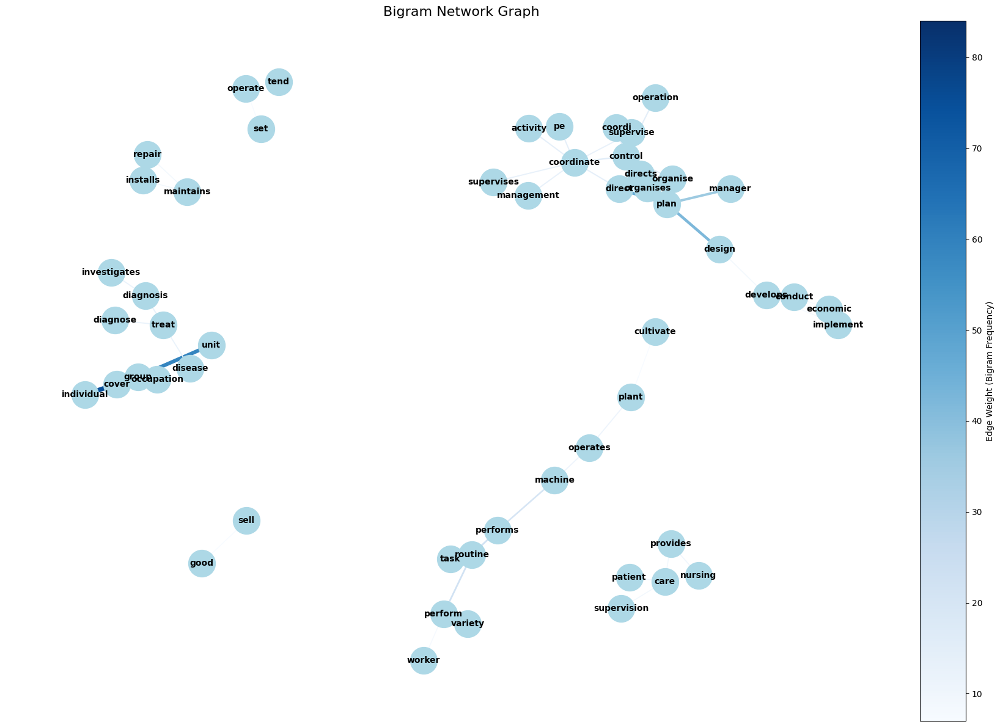

In [ ]:
from nltk import bigrams
import networkx as nx
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable

#n=50 limits the number of bigrams to display
def plot_bigram_network(tokens, n=50):
    # Get bigrams
    bi_grams = list(bigrams(tokens))

    # Count bigram frequencies
    bigram_freq = Counter(bi_grams)

    # Create network graph
    G = nx.Graph() # Create an empty undirected graph

    # Initialize empty lists to store edge widths and colors
    edge_width = []
    edge_color = []
    for bigram, count in bigram_freq.most_common(n):
        G.add_edge(bigram[0], bigram[1], weight=count)
        edge_width.append(count)
        edge_color.append(count)

    # Normalize edge widths for better visualization
    edge_width = np.array(edge_width)
    edge_width = 1 + (edge_width - edge_width.min()) * 5 / (edge_width.max() - edge_width.min()) #This normalizes the edge widths to a range between 1 and 6, making the differences in frequency visually apparent

    # Plot
    plt.figure(figsize=(16, 12))
    pos = nx.spring_layout(G, k=0.5, iterations=50) #Compute the position of nodes using the spring layout algorithm

    # Draw nodes
    nx.draw_networkx_nodes(G, pos, node_size=1000, node_color='lightblue')

    # Draw edges
    nx.draw_networkx_edges(G, pos, width=edge_width, edge_color=edge_color, edge_cmap=plt.cm.Blues)

    # Draw labels
    nx.draw_networkx_labels(G, pos, font_size=10, font_weight="bold")

    # Set the title, remove the axis, and adjust the layout
    plt.title('Bigram Network Graph', fontsize=16)
    plt.axis('off')
    plt.tight_layout()

    # Add a colorbar to show the weight scale
    divider = make_axes_locatable(plt.gca())  # Create a divider for the current axis
    cax = divider.append_axes("right", size="5%", pad=0.05) # Append axes for the colorbar next to the main plot
    sm = plt.cm.ScalarMappable(cmap=plt.cm.Blues, norm=plt.Normalize(vmin=min(edge_color), vmax=max(edge_color))) # Create a scalar mappable for the colorbar
    sm.set_array([]) # Set the array for the scalar mappable
    cbar = plt.colorbar(sm, cax=cax) # Create the colorbar
    cbar.set_label('Edge Weight (Bigram Frequency)', fontsize=10) # Set the label for the colorbar
    plt.show()

# Input is our list of tokenized words
plot_bigram_network(tokenized_words_cleaned)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import nltk

# Assuming `Occupation_descriptions` is your dataframe and 'ANZSCO Description' is the column with text data
nltk.download('stopwords')
from nltk.corpus import stopwords

# Preprocessing function to clean text
def preprocess_text(text):
    text = text.lower()  # Convert to lowercase
    words = nltk.word_tokenize(text)  # Tokenize the text
    words = [word for word in words if word.isalpha()]  # Remove non-alphabetic words
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words]  # Remove stopwords
    return ' '.join(words)

# Preprocess the occupation descriptions
Occupation_descriptions['Processed_Description'] = Occupation_descriptions['ANZSCO Description'].apply(preprocess_text)

# Step 1: Use TF-IDF Vectorizer to convert text into numerical vectors
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(Occupation_descriptions['Processed_Description'])

# Step 2: Compute Cosine Similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix, tfidf_matrix)

# Step 3: Convert the cosine similarity matrix into a DataFrame for easier interpretation
cosine_sim_df = pd.DataFrame(cosine_sim, index=Occupation_descriptions['ANZSCO Title'], columns=Occupation_descriptions['ANZSCO Title'])

# Print the cosine similarity matrix
print("\nCosine Similarity Matrix:")
print(cosine_sim_df.head())

# Get the top 5 most similar occupation descriptions to the first one (e.g., row 0)
most_similar = cosine_sim_df.iloc[0].sort_values(ascending=False).head(6)  # Include self-similarity (which will always be 1.0)
print("\nTop 5 most similar occupations to the first occupation:")
print(most_similar)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



Cosine Similarity Matrix:
ANZSCO Title                             Chief Executives and Managing Directors  \
ANZSCO Title                                                                       
Chief Executives and Managing Directors                                 1.000000   
General Managers                                                        0.174118   
Aquaculture Farmers                                                     0.000000   
Livestock Farmers                                                       0.000000   
Broadacre Crop Growers                                                  0.000000   

ANZSCO Title                             General Managers  \
ANZSCO Title                                                
Chief Executives and Managing Directors          0.174118   
General Managers                                 1.000000   
Aquaculture Farmers                              0.158249   
Livestock Farmers                                0.117414   
Broadacre Crop Gro

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


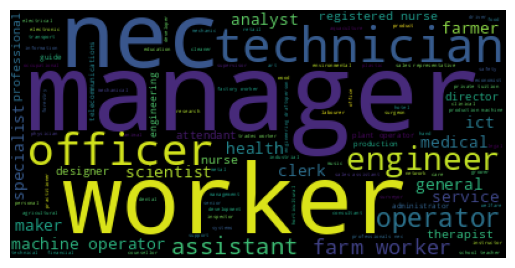

In [ ]:
OD_ANZSCODescription_lower = OD_ANZSCODescription.lower()

#create word tokens
tokenized_words=word_tokenize(OD_ANZSCODescription)

#Set up stop words for removal
nltk.download('stopwords')

#stopwords
stop_words=stopwords.words("english")

wordcloud_lower = WordCloud(max_words=100).generate(OD_ANZSCODescription_lower)
plt.imshow(wordcloud_lower)
plt.axis("off")
plt.show()

In [ ]:
from wordcloud import WordCloud
for column in Occupation_descriptions:
  globals()[f"OD_{column}"] = Occupation_descriptions[column].to_string(index=False)
  wordcloud = WordCloud(max_words=100).generate(OD_{column})

import matplotlib.pyplot as plt
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [ ]:
df_wc = pd.DataFrame()
df_wc['Index_wc1'] = Index['Unnamed: 0'].apply(word_count) + Index['Unnamed: 1'].apply(word_count)

print wordcount

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string

nltk.download('punkt')
nltk.download('stopwords')


In [ ]:
sum(df_wc['Index_wc1'])

691

In [ ]:
for df_name in existing_dfs:
    for col_name in df.columns:
        df[col_name + '_word_count'] = df[col_name].apply(word_count)

In [ ]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string

nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
import spacy

# Load spaCy's pre-trained English model
nlp = spacy.load("en_core_web_md")

# Function to extract named entities from text using spaCy
def extract_entities(text):
    # Process the text with spaCy's NLP pipeline
    doc = nlp(text)
    # Extract named entities (skills, job roles, etc.)
    entities = [ent.text for ent in doc.ents]
    return entities

# Apply the function to the 'ANZSCO Description' column
Occupation_descriptions['Extracted Entities'] = Occupation_descriptions['ANZSCO Description'].apply(extract_entities)

# Display the results
print(Occupation_descriptions[['ANZSCO Description', 'Extracted Entities']].head())

OSError: [E050] Can't find model 'en_core_web_md'. It doesn't seem to be a Python package or a valid path to a data directory.